# Citation








Animals-10
Corrado Alessio / alessiocorrado99@gmail.com / https://www.kaggle.com/datasets/alessiocorrado99/animals10

Guinea Pig Detection > 2024-03-14 8:40pm
https://universe.roboflow.com/projects-josub/guinea-pig-detection-grlwn
Provided by a Roboflow user
License: CC BY 4.0

Tortoises & Dolphins: [Dataset](https://www.kaggle.com/datasets/deepakat002/dolphintortoise)

Special thanks to [images.cv](https://images.cv) for providing images of most of the animals included in this project.

# ...

# Organize the images into labels and split them to train, val and test sets

In [1]:
import os
import zipfile
import shutil
import random
import time

start_time = time.time()

random.seed(42)

# dataset directories
imagecv_dir = '/kaggle/input/animals'
animal_ten_dir = '/kaggle/input/animal10/Animals-10'
tortsndolphs_base_dir = '/kaggle/input/dolphintortoise'
guinea_pigs_dir = '/kaggle/input/guinea-pig-detection'

# the location where we're going to extract the images
extract_base_dir = 'animal_images'
sets = ['train', 'val', 'test']


# These functions will be used throughout the cell

def move_contents_to_parent_dir(folder_path):
    '''Move contents of a directory to it's parent and delete it'''
    parent_dir = os.path.dirname(folder_path)

    # Iterate through all the items in the folder
    for item in os.listdir(folder_path):
        item_path = os.path.join(folder_path, item)
        # Move each item to the parent directory
        shutil.move(item_path, parent_dir)

    os.rmdir(folder_path)



def move_sample(src_dir, dst_dir, ratio, copy=True):
    '''Move a random sample of images from src_dir to dst_dir based on the given ratio.
    copy is a boolean value which determines if the source directory is manipulated or not'''

    if ratio <= 0 or ratio > 1:
        print('ratio must be a number in range (0,1]')
        return None # early termination

    samples = os.listdir(src_dir)
    num_samples = len(samples)
    num_samples_to_move = round(num_samples * ratio)
    samples_to_move = random.sample(samples, num_samples_to_move)

    for sample in samples_to_move:
        src_path = os.path.join(src_dir, sample)
        dst_path = os.path.join(dst_dir, sample)   
        if not copy:
            shutil.move(src_path, dst_path)   
        else:
            if os.path.isdir(src_path):
                shutil.copytree(src_path, dst_path)
            else:
                shutil.copy(src_path, dst_path)     
    # the source dir is deleted automatically if all of its contents are moved
    if ratio == 1 and not copy:
        shutil.rmtree(src_dir)
        
        
        
def train_test_val_split(base_dir, copy=True):
        '''
        Split the images of a given base directory and add them to training, test and validation sets. The base_dir is expected to contain subdirectories with images (10 animals / tortoises and dolphins)
        '''
        # Train-test-val split ratios (keep in mind that the remaining size after movement affects the ratios)
        split = {'val': 0.1, 'test': 0.2, 'train': 1}
         # first move each animal's 10% to validation set, then 20% of remaining to test, then the images that remain at the end to train set
        dirs = os.listdir(base_dir)
        for dirname in dirs:
            dir_ = os.path.join(base_dir, dirname)
            for set_ in sets:
                os.makedirs(os.path.join(extract_base_dir, set_, dirname.title()), exist_ok=True)
            for set_, ratio in split.items():
                move_sample(dir_, os.path.join(extract_base_dir, set_, dirname.title()), ratio=ratio, copy=copy)
                
                

            
train_path = os.path.join(extract_base_dir, 'train')
test_path = os.path.join(extract_base_dir, 'test')
val_path = os.path.join(extract_base_dir, 'val')


# a flag to prevent further redundant runs.
# the code below is meant to only run once to extract and organize images
run = True
if run:

    # Ensures that everything is redone from scratch cleanly
    rewrite = True
    if rewrite:
        if os.path.exists(extract_base_dir):
            shutil.rmtree(extract_base_dir)

    # Create the extract base directory if it doesn't exist
    os.makedirs(extract_base_dir, exist_ok=True)

    # the code iterates thrice and forms train, val and test sets
    print(f'Extracting ImageCV images ({len(os.listdir(imagecv_dir))} classes)')
    for set_ in sets:

        print(f'Working on {set_} data')

        # Locate the extraction path
        set_dir = os.path.join(extract_base_dir, set_)
        os.makedirs(set_dir, exist_ok=True)

        # extracting the ImagesCV images 
        for dirname in os.listdir(imagecv_dir):
            # the images are nested (imagescv.../data/train/images)
            # this code gets the images out of it and renames the directory to the animal name
            label_dir = os.path.join(imagecv_dir, dirname, f'images.cv_{dirname}', 'data', set_)
            # for some reason the images in directories are stored in 2 redundant folders 
            # eg 'Zebra' and 'Animal Zebra'. This code makes sure that the images are extracted
            # together and under 'Zebra' folder.
            label = min(os.listdir(label_dir), key=len).title().replace('_', ' ')
            # just to make sure
            if label.split(' ')[0] == 'Animal':
                label = label[len('Animal '):]
            label_new_dir = os.path.join(set_dir, label)
            os.makedirs(label_new_dir, exist_ok=True)
            # in this case the function is used to simply copy the images to new directory 
            move_sample(label_dir, label_new_dir, ratio=1, copy=True) 
            # at this point, the tree copied looks like this:
            # Zebra -- Zebra
            #       -- Animal Zebra
            # this is where the function defined earlier comes into play
            for child_dirname in os.listdir(label_dir):
                move_contents_to_parent_dir(os.path.join(label_new_dir, child_dirname))


    print('Transferring half of the test set to train set (60-30-10 split turns into a 75-15-10 split)')
    for animal in os.listdir(test_path):
        animal_test_dir = os.path.join(test_path, animal)
        animal_train_dir = os.path.join(train_path, animal)
        move_sample(animal_test_dir, animal_train_dir, ratio = 0.5, copy=False)


    print(f'Extracting Animals-10 ({len(os.listdir(animal_ten_dir))} classes)')
    # the function splits the data to train, test, validation sets 
    # and copypastes them directly from the source
    train_test_val_split(animal_ten_dir, copy=True)
    
    print('Extracting Guinea Pigs')
    # dirnames in extract folder vs dirnames in the guinea pigs dataset
    guinea_pig_matchings = {'train': 'train', 'test': 'test', 'val': 'valid'}
    for set_, gp_set_ in guinea_pig_matchings.items():
        # extract the images from the dataset's directory
        img_dir = os.path.join(guinea_pigs_dir, gp_set_, 'images')
        # keep in mind that the for loop which extracted ImageCV images already created labels with animal names
        # so we can refer to animals directly at this point like in train_test_val_split function
        move_sample(img_dir, os.path.join(extract_base_dir, set_, 'Guinea Pig'), ratio=1, copy=True)
    
    
    print('Extracting Tortoises and Dolphins')
    # the dataset consists of jpg-txt (image-label) pairs with the same string as an identifier
    strings = set([img.split('.')[0] for img in os.listdir(tortsndolphs_base_dir)])

    # Create subdirectories for tortoises and dolphins inside output file system
    tortsndolphs_output_dir = os.path.join(extract_base_dir, 'tortdolph')
    torts_output_sub = os.path.join(tortsndolphs_output_dir,'tortoise')
    dolphs_output_sub = os.path.join(tortsndolphs_output_dir, 'dolphin')
    os.makedirs(tortsndolphs_output_dir, exist_ok=True)
    os.makedirs(torts_output_sub, exist_ok=True)
    os.makedirs(dolphs_output_sub, exist_ok=True)
    for str_ in strings:
        # get an image and its label from the dataset
        img_path = os.path.join(tortsndolphs_base_dir, f'{str_}.jpg')
        label_path = os.path.join(tortsndolphs_base_dir, f'{str_}.txt')
        with open(label_path, 'r') as label:
            # label 0 indicates a dolphin, label 1 indicates a tortoise.
            # dolphins and tortoises are collected inside output subdirs 
            # and then added to already existing Tortoise and Dolphin label dirs
            first_line = label.readline().strip()
            if first_line.startswith('1'):
                shutil.copy(img_path, torts_output_sub)
            elif first_line.startswith('0'):
                shutil.copy(img_path, dolphs_output_sub)
        
    # allocate the formed dirs into train, test and val sets
    train_test_val_split(tortsndolphs_output_dir)
    shutil.rmtree(tortsndolphs_output_dir)
    
    print('Merging and Renaming Similar Classes')
    # merge similar classes for better generalization, considering the little size of data
    mappings = {
        'Hog': 'Pig',
        'Hen': 'Chicken',
        'Cock': 'Chicken',
        'Whale': 'Grey Whale',
        'White Wolf': 'Timber Wolf',
        'Red Fox': 'Kit Fox',
        'Ice Bear': 'Brown Bear',
        'Box Turtle': 'Tortoise',
        'Mud Turtle': 'Tortoise'
    }

    # give more general names to new labels
    rename = {
        'Timber Wolf': 'Wolf',
        'Kit Fox': 'Fox',
        'Brown Bear': 'Bear',
        'Tortoise': 'Turtle or Tortoise'
    }


    for set_ in sets:

        for old, new in mappings.items():
            old_dir = os.path.join(extract_base_dir, set_, old)
            new_dir = os.path.join(extract_base_dir, set_, new)
            if os.path.exists(old_dir):
                move_sample(old_dir, new_dir, ratio=1, copy=False)

        for old, new in rename.items():
            old_dir = os.path.join(extract_base_dir, set_, old)
            new_dir = os.path.join(extract_base_dir, set_, new)
            os.makedirs(new_dir, exist_ok=True)
            if os.path.exists(old_dir):
                os.rename(old_dir, new_dir)


    print('Finished.')
    print(f'The final number of classes is {len(os.listdir(train_path))}.')
    
    
# End the timer
end_time = time.time()

# Calculate the execution time
execution_time = end_time - start_time
print(f"Execution time: {execution_time} seconds") 

Extracting ImageCV images (48 classes)
Working on train data
Working on val data
Working on test data
Transferring half of the test set to train set (60-30-10 split turns into a 75-15-10 split)
Extracting Animals-10 (10 classes)
Extracting Guinea Pigs
Extracting Tortoises and Dolphins
Merging and Renaming Similar Classes
Finished.
The final number of classes is 49.
Execution time: 914.2774007320404 seconds


# Convert raw images into tf.data.Dataset instances

In [2]:
import tensorflow as tf

# apply mixed precision training which is considerably faster
tf.keras.mixed_precision.set_global_policy('mixed_float16')

paths = {'train': train_path, 'val': val_path, 'test': test_path}
# all datasets will be stored in this dict
data = {}
batch_size = 32
target_size = (224, 224)

data_augmentation = tf.keras.Sequential([
    tf.keras.layers.RandomFlip('horizontal', seed=42),
    tf.keras.layers.RandomRotation(0.05, seed=42),
    tf.keras.layers.RandomContrast(0.2, seed=42),
])

for key, path in paths.items():

    # Create a tf.data.Dataset from raw images and apply prefetching
    data[key] = tf.keras.utils.image_dataset_from_directory(
        path,
        label_mode='categorical',
        image_size=target_size,
        batch_size=batch_size,
        shuffle=True if key == 'train' else False
    ).prefetch(buffer_size=tf.data.AUTOTUNE)
    

# apply data augmentation on training set
data['train_augmented'] = data['train'].map(lambda X, y: (data_augmentation(X), y), num_parallel_calls=tf.data.AUTOTUNE)
    
data

Found 75698 files belonging to 49 classes.
Found 11222 files belonging to 49 classes.
Found 14057 files belonging to 49 classes.


{'train': <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 49), dtype=tf.float32, name=None))>,
 'val': <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 49), dtype=tf.float32, name=None))>,
 'test': <_PrefetchDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float32, name=None), TensorSpec(shape=(None, 49), dtype=tf.float32, name=None))>,
 'train_augmented': <_ParallelMapDataset element_spec=(TensorSpec(shape=(None, 224, 224, 3), dtype=tf.float16, name=None), TensorSpec(shape=(None, 49), dtype=tf.float32, name=None))>}

# Train a CNN from scratch

In [3]:
cnn_from_scratch = tf.keras.Sequential([
    tf.keras.layers.Input(shape=(128,128,3)),
    tf.keras.layers.Conv2D(filters=16, kernel_size=3, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(filters=16, kernel_size=3, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Conv2D(filters=32, kernel_size=3, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Conv2D(filters=32, kernel_size=3, activation='relu'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.MaxPooling2D(),
    tf.keras.layers.Flatten(),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Dense(128, activation='relu', kernel_initializer='he_normal'),
    tf.keras.layers.BatchNormalization(),
    tf.keras.layers.Dropout(0.25),
    tf.keras.layers.Dense(49, activation='softmax')
    ])

# the images get scaled just once and then go through the network
my_cnn = tf.keras.Sequential([
    tf.keras.layers.Rescaling(1./255),
    cnn_from_scratch
])

my_dir = 'my_cnn'
os.makedirs(my_dir, exist_ok=True)

Define loss, callbacks and optimizer and compile the model

In [4]:
loss='categorical_crossentropy'
optimizer = tf.keras.optimizers.Nadam(learning_rate=0.001)
early_stopping = tf.keras.callbacks.EarlyStopping(patience=5, monitor='val_loss', restore_best_weights=True, mode='min')
checkpoint = tf.keras.callbacks.ModelCheckpoint(filepath=os.path.join(my_dir, 'my_checkpoints.keras'), save_best_only=True, monitor='val_loss', mode='min')
metrics=['accuracy', tf.keras.metrics.F1Score(average='macro')]
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, min_lr=1e-6)


my_cnn.compile(loss=loss, optimizer=optimizer, metrics=metrics)

Training

In [5]:
train = False
if train:

    import json

    history = my_cnn.fit(data['train_augmented'], validation_data=data['val'], 
        epochs=100, callbacks=[early_stopping, checkpoint, lr_scheduler])

    # save the model
    my_cnn.save(os.path.join(my_dir, 'my_cnn.h5'))

    # Save training history
    history_dict = history.history
    with open(os.path.join(my_dir,'training_history.json'), 'w') as f:
        json.dump(history_dict, f)

    # Save the best epoch
    best_epoch = early_stopping.stopped_epoch - early_stopping.patience + 1
    with open(os.path.join(my_dir,'best_epoch.txt'), 'w') as f:
        f.write(f'Best epoch: {best_epoch}')

# The model plateued at 0.53 f1 score. Considering how each class is relatively small (1000 images) and how time consuming building and training a CNN for scratch is (with probably suboptimal results), transfer learning becomes a more appealing solution. Using a pretrained archihecture now, particularly EfficientNetB0.

In [6]:
from tensorflow.keras.applications import EfficientNetB0, efficientnet

base_model = tf.keras.applications.EfficientNetB0(
input_shape=(224, 224, 3),
include_top=False,
weights='imagenet',
)


# convert images to numbers and apply the necessary preprocessing for effnet
def preprocess_input(image, label):
    image = tf.cast(image, tf.float32)
    image = efficientnet.preprocess_input(image)
    return image, label

# Freeze the base model's layers
base_model.trainable = False

# apply effnet's preprocessing function on data
data['train_pre'] = data['train_augmented'].map(lambda X, y: preprocess_input(X, y), num_parallel_calls=tf.data.AUTOTUNE)
data['val_pre'] = data['val'].map(lambda X, y: preprocess_input(X, y), num_parallel_calls=tf.data.AUTOTUNE)
data['test_pre'] = data['test'].map(lambda X, y: preprocess_input(X, y), num_parallel_calls=tf.data.AUTOTUNE)

inputs = tf.keras.Input(shape=(224, 224, 3))
x = base_model(inputs, training=False)
# this layer will considerably speed up training. its all we need aside from the output layer
x = tf.keras.layers.GlobalAveragePooling2D()(x)
outputs = tf.keras.layers.Dense(49, activation='softmax')(x)  

model = tf.keras.Model(inputs, outputs)

# bigger learning rate to get the output layer up faster
optimizer_pre = tf.keras.optimizers.SGD(learning_rate=0.1, momentum=0.9, nesterov=True)
model.compile(loss=loss, optimizer=optimizer_pre, metrics=metrics)

16705208/16705208 ━━━━━━━━━━━━━━━━━━━━ 0s 0us/step


Train for 2 epochs to warm up the output layer

In [7]:
train = False
if train:
    history = model.fit(data['train_pre'], validation_data=data['val_pre'], epochs=2, callbacks=[early_stopping, checkpoint, lr_scheduler], initial_epoch=2)

Unfreeze the upper half of EfficientNet and continue training

In [8]:
# Calculate the number of layers to unfreeze
num_layers = len(base_model.layers)
num_layers_to_unfreeze = num_layers // 2

# Unfreeze the upper half of the layers
for layer in base_model.layers[-num_layers_to_unfreeze:]:
    layer.trainable = True

optimizer_1 = tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9, nesterov=True) # slower learning rate to avoid hurting the weights

model.compile(loss=loss, optimizer=optimizer_1, metrics=metrics)

In [9]:
train = False
if train:
    history = model.fit(data['train_pre'], validation_data=data['val_pre'], epochs=10, callbacks=[early_stopping, checkpoint, lr_scheduler], initial_epoch=2)

Unfreeze all the layers and train again.

In [10]:
for layer in base_model.layers:
    layer.trainable = True


early_stopping_eff = tf.keras.callbacks.EarlyStopping(patience=5, monitor='val_loss', restore_best_weights=True, mode='min')
checkpoint_eff = tf.keras.callbacks.ModelCheckpoint(filepath='efficientnetweights.keras', save_best_only=True, monitor='val_loss', mode='min')
metrics=['accuracy', tf.keras.metrics.F1Score(average='macro')]
lr_scheduler = tf.keras.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.1, patience=3, min_lr=1e-6, min_delta=1e-3)

model.compile(loss=loss, optimizer=tf.keras.optimizers.SGD(learning_rate=0.01, momentum=0.9, nesterov=True), metrics=metrics)

# Going all out this time.

In [11]:
train = False
if train:
    history = model.fit(data['train_pre'], validation_data=data['val_pre'], epochs=100, callbacks=[early_stopping_eff, checkpoint_eff, lr_scheduler])

# Loading the resulting model (now saved on Kaggle)

In [12]:
animal_classifier = tf.keras.models.load_model('/kaggle/input/animal_classifier/keras/default/3/animal_classifier.keras')

/opt/conda/lib/python3.10/site-packages/keras/src/saving/saving_lib.py:415: UserWarning: Skipping variable loading for optimizer 'loss_scale_optimizer', because it has 219 variables whereas the saved optimizer has 6 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))
/opt/conda/lib/python3.10/site-packages/keras/src/saving/saving_lib.py:415: UserWarning: Skipping variable loading for optimizer 'SGD', because it has 215 variables whereas the saved optimizer has 2 variables. 
  saveable.load_own_variables(weights_store.get(inner_path))


# After 24 epochs in total, the resulting neural network achieves 0.96 accuracy, 0.955 f1 macro score and 0.15 cross entropy loss on the validation set.

In [13]:
animal_classifier.evaluate(data['val_pre'])

I0000 00:00:1731522197.156175      55 service.cc:145] XLA service 0x7df8bc00e780 initialized for platform Host (this does not guarantee that XLA will be used). Devices:
I0000 00:00:1731522197.156244      55 service.cc:153]   StreamExecutor device (0): Host, Default Version
I0000 00:00:1731522201.688974      55 device_compiler.h:188] Compiled cluster using XLA!  This line is logged at most once for the lifetime of the process.


351/351 ━━━━━━━━━━━━━━━━━━━━ 5562s 16s/step - accuracy: 0.9659 - f1_score: 0.4988 - loss: 0.1431


[0.15515291690826416, 0.9629299640655518, 0.9548586010932922]

# Evaluate the model on test set

In [14]:
import numpy as np

# get numpy arrays for sklearn's classification_report
y_pred = animal_classifier.predict(data['test_pre']).round().astype('float32')
y_true = np.concatenate([y for x, y in data['test']], axis = 0)

440/440 ━━━━━━━━━━━━━━━━━━━━ 6892s 16s/step


# The network performed even better on the test set and achieved 0.98 F1 Macro score. This could be attributed to validation set being too small and unrepresentative to show the model's real potential. We hope that this didnt significantly affect training due to early stopping and learning schedule adapting to validation set performance.
# Its also worth noting that this is a baseline task. The classes are distinct, each image contains just 1 class, and all the model has to do is predicting that class. If we were to dive deeper: multiple objects each image, different species of spiders or snakes or monkeys, localization etc, surely we would need much more images: tens of thousands instead of hundreds each class.

In [15]:
import pandas as pd
from sklearn.metrics import classification_report

report = pd.DataFrame(classification_report(y_true, y_pred, output_dict=True)).transpose().reset_index(drop=True)
class_names = tf.keras.utils.image_dataset_from_directory(test_path).class_names
class_names_df = pd.DataFrame([dict(zip(range(len(class_names)), class_names))], index=['Name']).transpose().reset_index(drop=True)

classification_report_ = pd.concat([report, class_names_df], axis=1)

classification_report_ 

/opt/conda/lib/python3.10/site-packages/sklearn/metrics/_classification.py:1344: UndefinedMetricWarning: Precision and F-score are ill-defined and being set to 0.0 in samples with no predicted labels. Use `zero_division` parameter to control this behavior.
  _warn_prf(average, modifier, msg_start, len(result))


Found 14057 files belonging to 49 classes.


,precision,recall,f1-score,support,Name
0,0.983122,0.983122,0.983122,237.0,Ant
1,1.000000,0.978495,0.989130,186.0,Arabian Camel
2,0.974265,0.985130,0.979667,269.0,Bear
3,0.997636,1.000000,0.998817,422.0,Butterfly
4,0.994030,0.997006,0.995516,334.0,Cat
5,0.998986,1.000000,0.999493,985.0,Chicken
6,0.986111,0.972603,0.979310,219.0,Chimpanzee
7,1.000000,1.000000,1.000000,373.0,Cow
8,1.000000,1.000000,1.000000,973.0,Dog
9,0.974093,0.974093,0.974093,193.0,Dolphin


# Confusion matrix reveals the model's weak spots. In particular, model struggles the most with rabbits and weasels, which have 0.94 and 0.95 f1 scores respectively. Both are among the smallest classes and also have some similarities with other classes: rabbits are most commonly confused with cats, and weasels are confused with ants. 

In [16]:
from sklearn.metrics import confusion_matrix

y_true_classes = np.argmax(y_true, axis=1)
y_pred_classes = np.argmax(y_pred, axis=1)

confusion_mtx = confusion_matrix(y_true_classes, y_pred_classes, normalize='true')
confusion_df = pd.DataFrame(confusion_mtx, index = class_names, columns = class_names)
pd.set_option('display.max_columns', None)
pd.set_option('display.max_rows', None)
confusion_df

,Ant,Arabian Camel,Bear,Butterfly,Cat,Chicken,Chimpanzee,Cow,Dog,Dolphin,Echidna,Elephant,Fly,Fox,Giant Panda,Goldfish,Gorilla,Grey Whale,Guinea Pig,Hamster,Hedgehog,Hippopotamus,Horse,Koala,Leopard,Lesser Panda,Lion,Lizard,Mantis,Marmot,Orangutan,Pig,Rabbit,Ram,Rhinoceros,Sheep,Snail,Snake,Spider,Squirrel,Starfish,Tiger,Tiger Shark,Tree Frog,Triceratops,Turtle or Tortoise,Weasel,Wolf,Zebra
Ant,0.983122,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.004219,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.008439,0.0,0.000000,0.000000,0.000000,0.004219,0.000000,0.000000,0.000000,0.000000,0.000000
Arabian Camel,0.000000,0.978495,0.000000,0.000000,0.000000,0.000000,0.010753,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.005376,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.005376,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Bear,0.000000,0.000000,0.985130,0.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.003717,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.007435,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.003717,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Butterfly,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Cat,0.000000,0.000000,0.000000,0.000000,0.997006,0.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.002994,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Chicken,0.000000,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Chimpanzee,0.004566,0.000000,0.000000,0.000000,0.000000,0.000000,0.972603,0.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.013699,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.009132,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Cow,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,1.0,0.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
Dog,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,1.0,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.0,0.000000,0.000000,0.000000,

# Let's take a look at the model in action. The code below takes a random batch each time and shows its images alongside with label and prediction.

Found 14057 files belonging to 49 classes.
1/1 ━━━━━━━━━━━━━━━━━━━━ 8s 8s/step


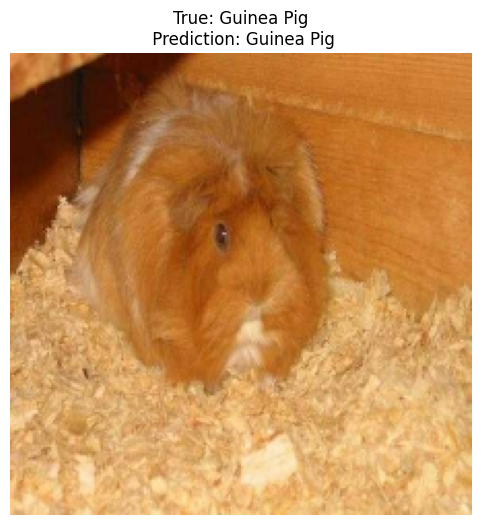

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 631ms/step


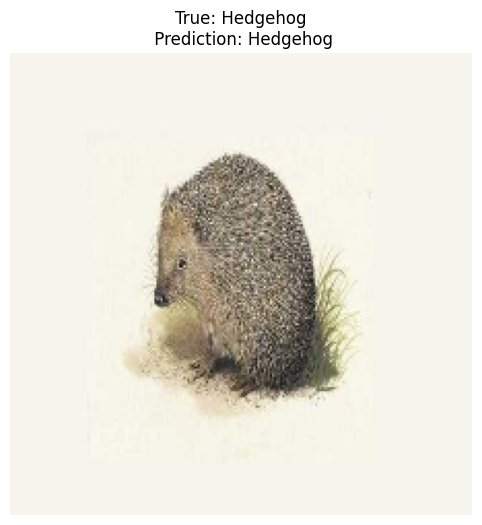

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 631ms/step


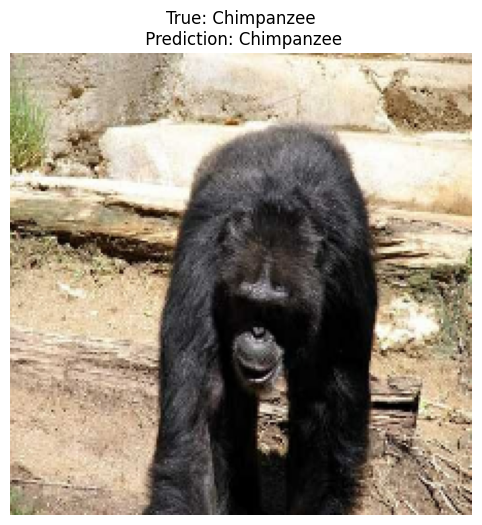

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 624ms/step


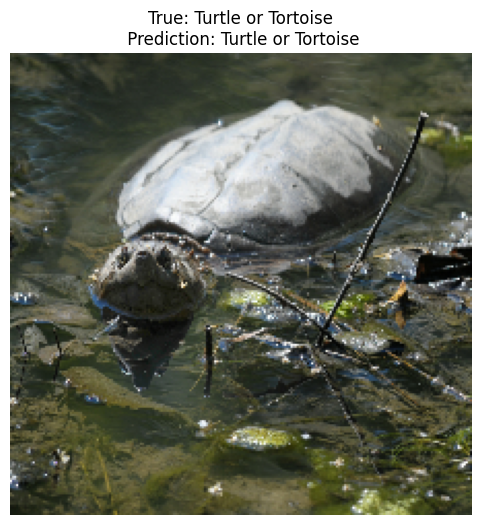

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 642ms/step


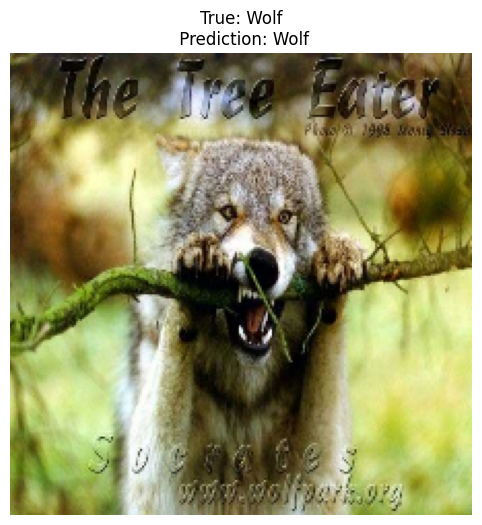

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 677ms/step


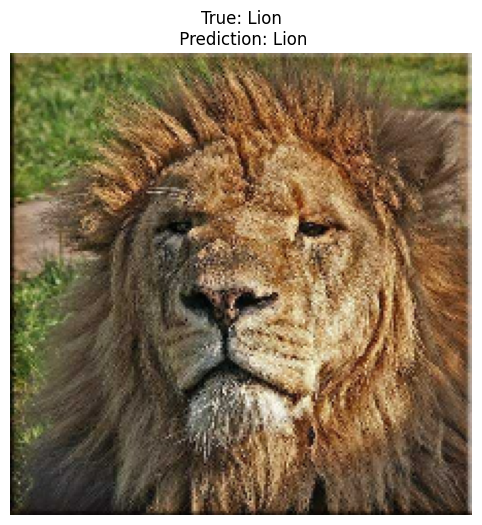

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 635ms/step


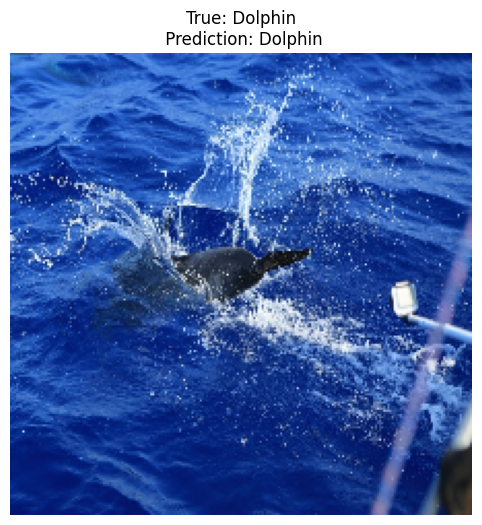

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 627ms/step


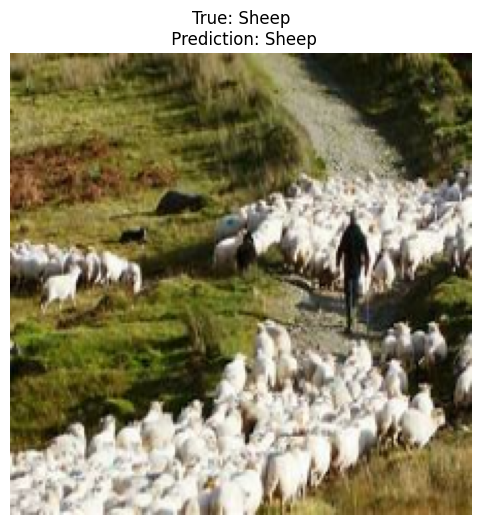

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 628ms/step


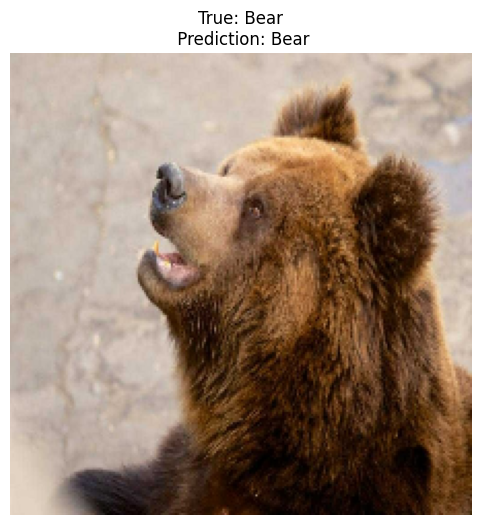

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 625ms/step


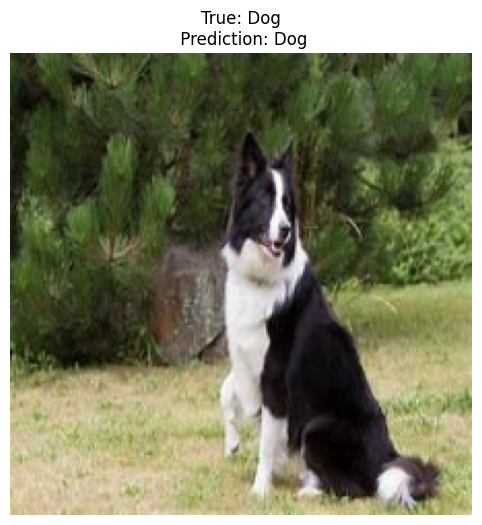

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 622ms/step


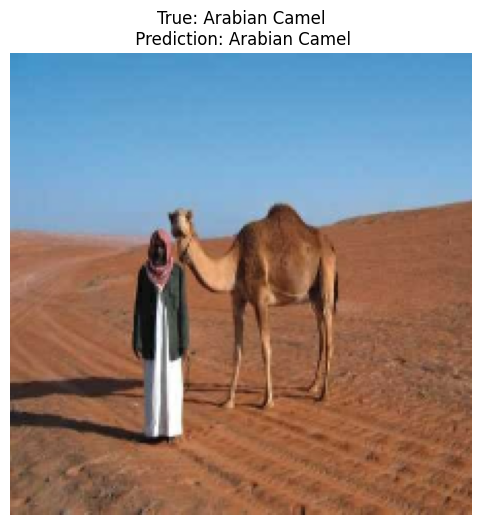

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 641ms/step


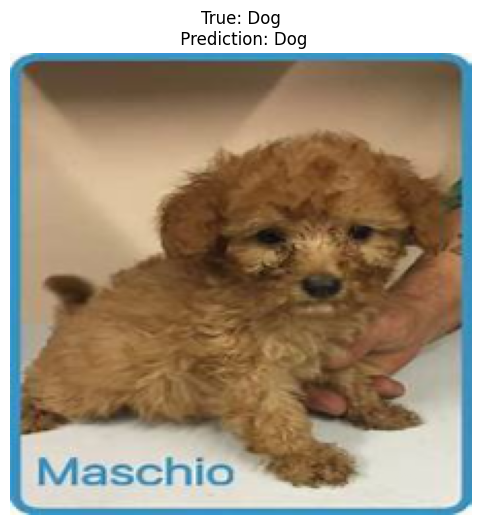

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 623ms/step


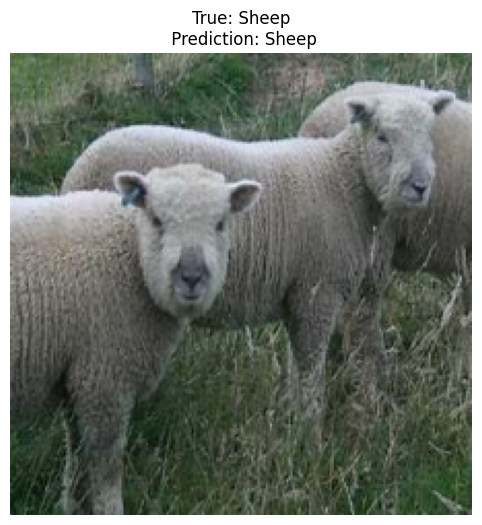

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 631ms/step


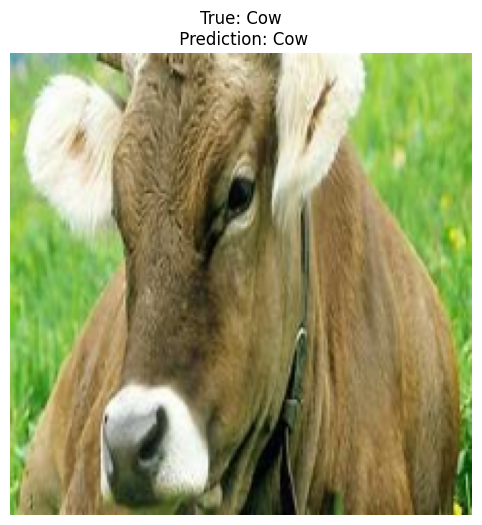

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 621ms/step


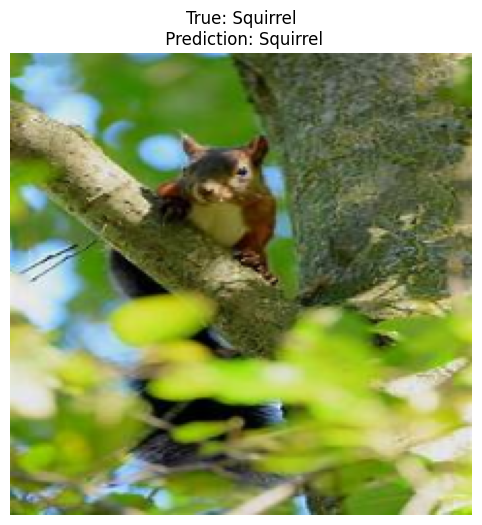

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 619ms/step


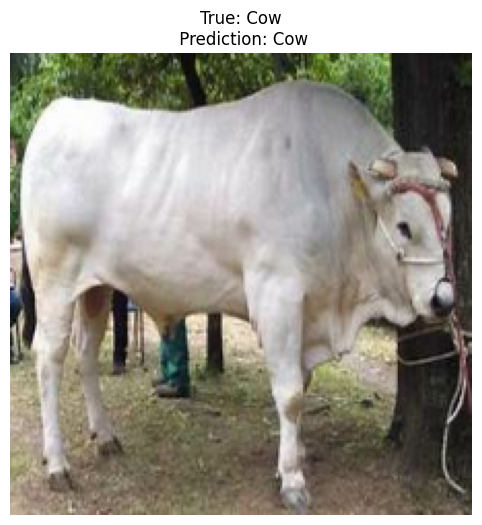

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 631ms/step


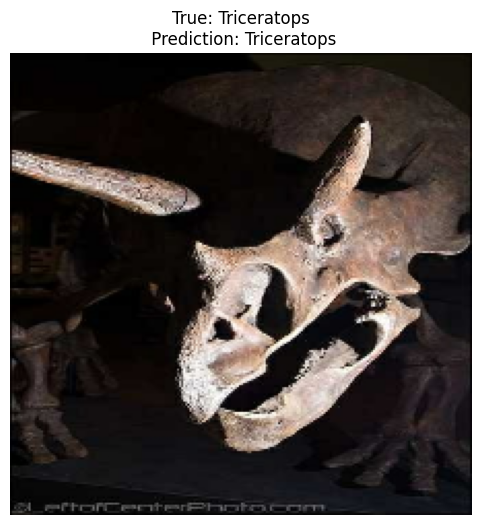

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 616ms/step


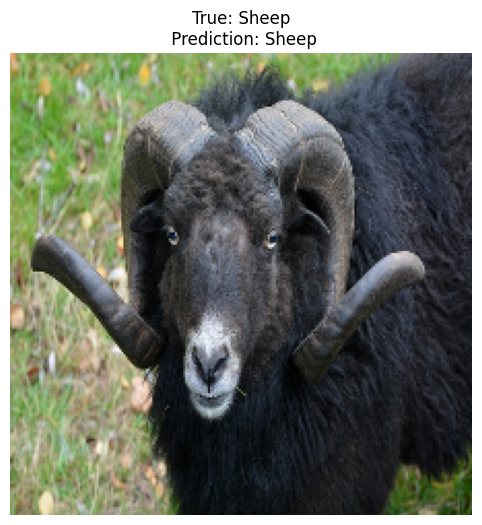

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 627ms/step


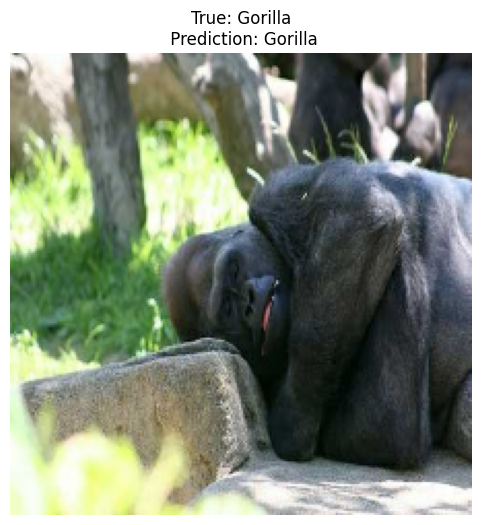

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 649ms/step


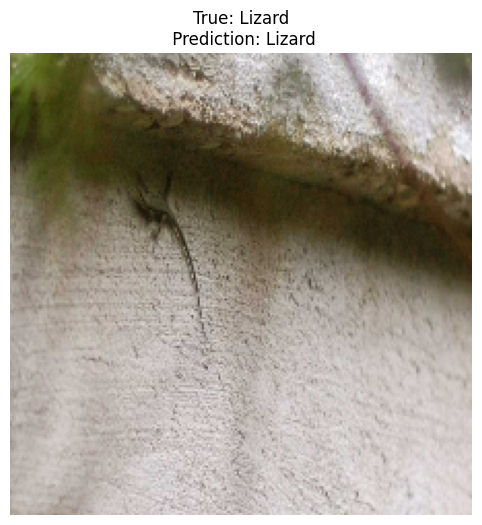

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 662ms/step


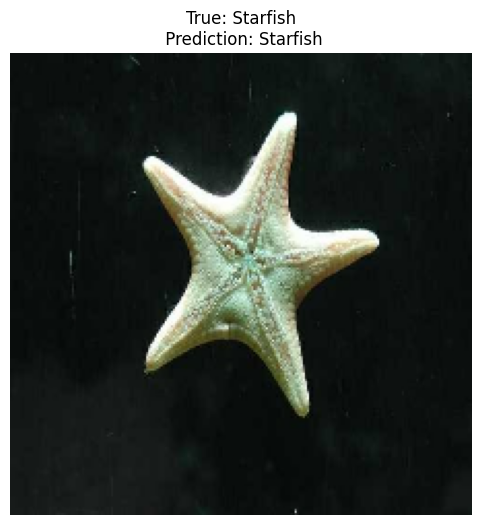

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 641ms/step


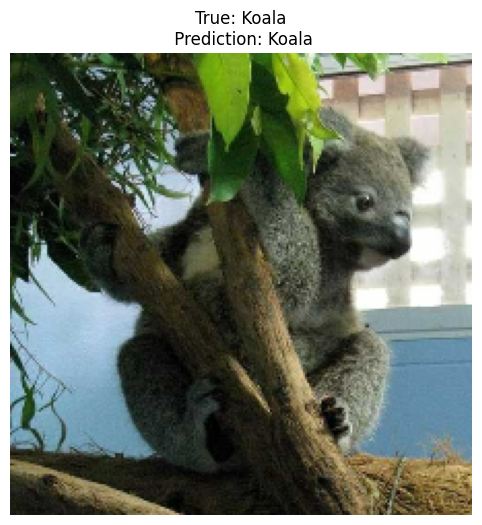

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 630ms/step


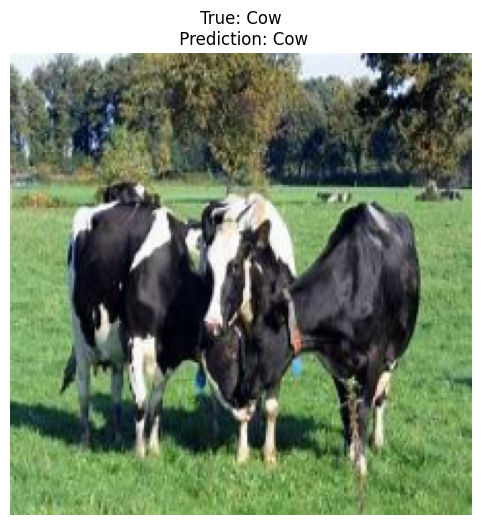

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 623ms/step


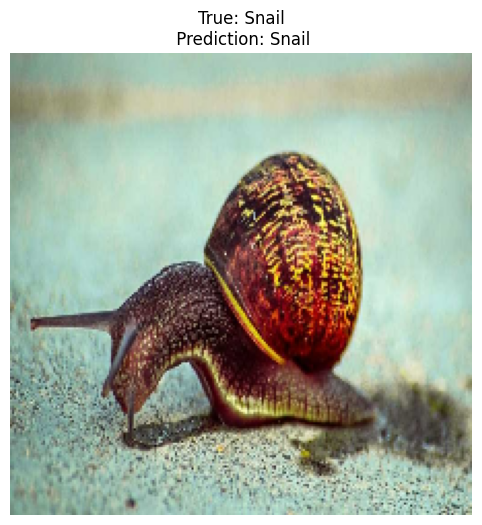

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 620ms/step


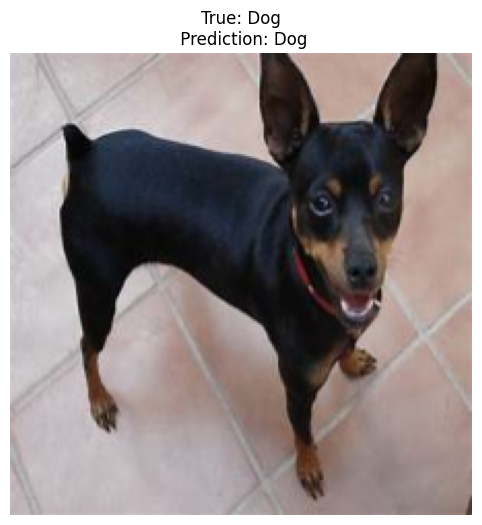

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 627ms/step


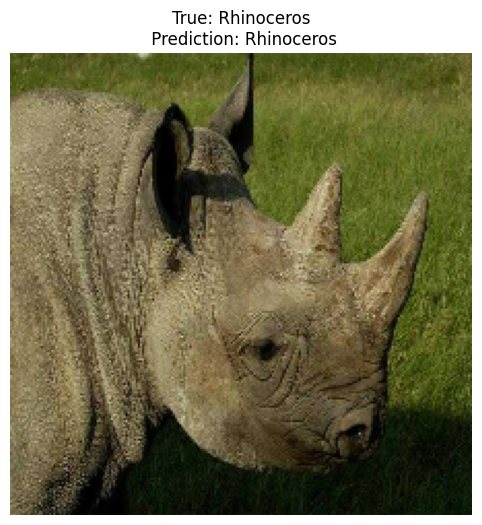

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 628ms/step


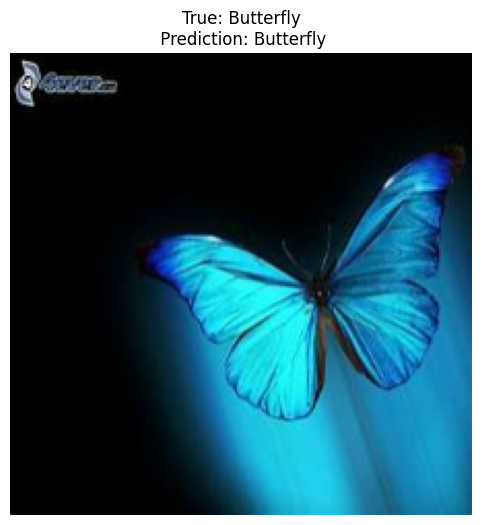

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 625ms/step


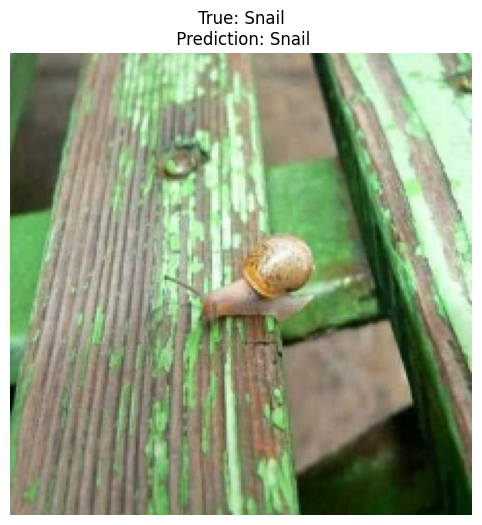

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 625ms/step


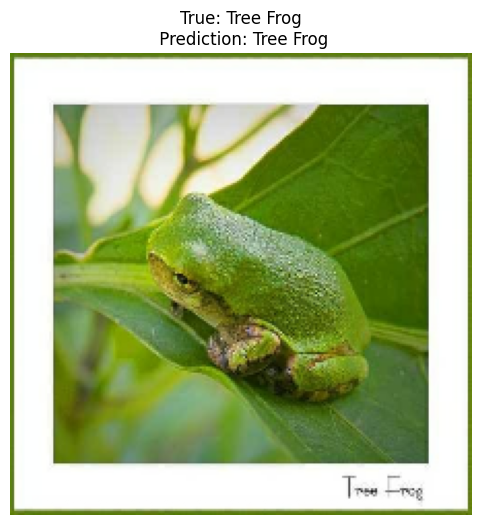

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 626ms/step


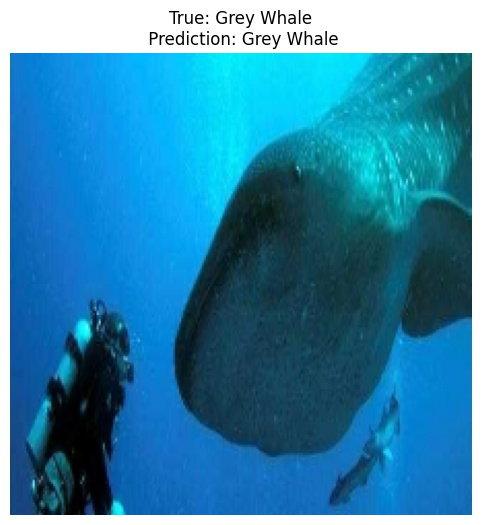

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 638ms/step


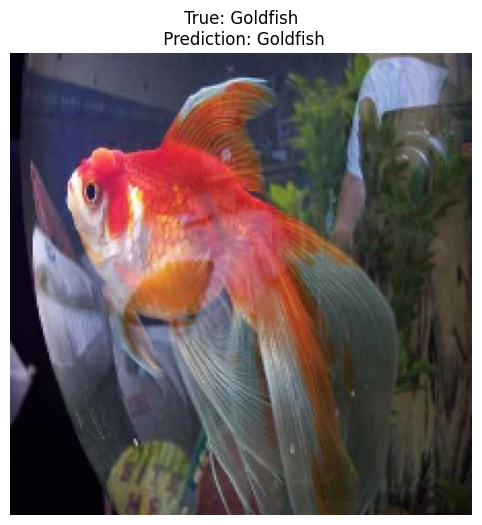

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 640ms/step


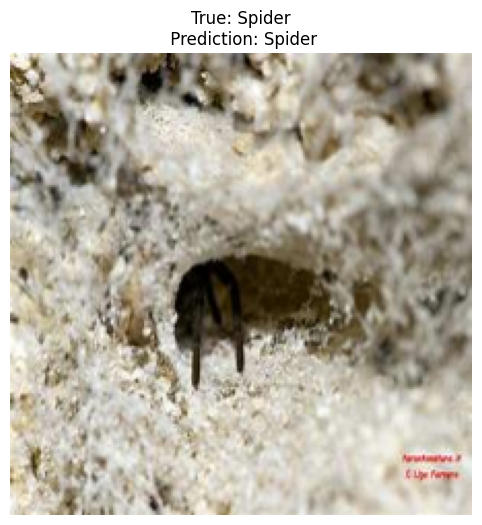

In [17]:
import matplotlib.pyplot as plt

# shuffle the test so each batch contains multiple animals (for visualization)
shuffled_test_data = tf.keras.utils.image_dataset_from_directory(
        test_path,
        label_mode='categorical',
        image_size=target_size,
        batch_size=batch_size,
        shuffle=True
).prefetch(buffer_size=tf.data.AUTOTUNE)


num_batches = tf.data.experimental.cardinality(shuffled_test_data).numpy()
random_batch_number = np.random.randint(num_batches)

random_batch = shuffled_test_data.skip(random_batch_number).take(1)


for images, labels in random_batch: # seperate images from labels
    for image, label in zip(images, labels): # seperate each image and its label
        true_class_code = tf.argmax(label)
        image_4d = tf.expand_dims(image, axis=0)
        prediction = animal_classifier.predict(image_4d)
        predicted_class_code = tf.argmax(prediction, axis=1).numpy().item()
        true_class = class_names[true_class_code]
        predicted_class = class_names[predicted_class_code]
        
        # rescale for appropriate visualization
        image = tf.cast(image, tf.float32) / 255.0
        
        plt.figure(figsize=(8,6))
        plt.imshow(image)
        plt.title(f'True: {true_class}\n Prediction: {predicted_class}')
        plt.axis('off')
        plt.show()
          
# the code will display new images (batch) with each execution

# Conclusion

# With the help of transfer learning, we've managed to train a neural network which excellently distinguishes 50 animals with only 1000 images per class.